<head>
    <style>
        .md-typeset h2 {
            margin:0;
            }
        .md-typeset h3 {
            margin:0;
            }
        .jupyter-wrapper table.dataframe tr, .jupyter-wrapper table.dataframe th, .jupyter-wrapper table.dataframe td {
            text-align:left;
            }
        .jupyter-wrapper table.dataframe {
            table-layout: auto;
            }
        .jp-RenderedText pre {
            display: inline-block;
            overflow-x: auto;
            width: max-content;
        }
    </style>
</head>

# Lab 1 - Normal Distribution

In this lab, you would practice how to

* read Stata data file (.dta) into Stata, clean and tidy your dataset 
* summarize a dataset with descriptive statistics, such as mean, standard deviation, etc.
* visualise a dataset to present the trend, key features or relationship of variables, such as scatter, box, histogram, etc. 
* calculate the probability of an event when a random variable follows the normal distribution
* examine whether a variable follows the normal distribution or not through graph and statistical test.

After this lab, you are expected

* to know the primary process of data analysis: reading dataset, clean and tidy it, and visualize it
* to know what the normal distribution is and to know how to calculate the probability of an event
* to transform a normal distribution to the standard one
* to test whether a variable follows the normal distribution or not

## Introduction 

Later when you do your own project, you might have different data files and 
want to save your results and plots in one file. Stata read data and save 
your results in the default file, which you might not want to use it. To 
manage your files efficiently, you are recommended to set up your working directory. 

Please watch the following video and learn how to set up your working directory.

<iframe width="600" height="315" src="https://www.youtube.com/embed/1jX0my1xiBo" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

After you set up your working directory, you could type `pwd` to check your 
working directory (it should be different from `C:\Users\fewang\ienc\code`, which is 
my working directory).

Every time when you start a new session of doing your data analysis, 
it is better to clear the memory of Stata and command history window. 
To do it, we need `clear` and `cls` command. The command `clear` will clear 
the memory of Stata and delete all datasets you have read into 
Stata and `cls` will clear the command history window.

In [1]:
clear

We will continue to use `height_weight.dta` from the last Lab for this part. 
Hope now you feel more comfortable with Stata. In this section, we would 
check whether the current working directory is at the same folder with the 
dataset we would use, then we will read the dataset into Stata and examine it. 
These steps are common routine of doing any data analysis. 

In [2]:
pwd

C:\Users\fewang\ienc\Code


The above working directory is mine. The folder `Code` has the dataset - `height_weight.dta`.

If the current working directory is not the one you want to work on, then you could change it. 
Now, please download the dataset [height_weight.dta](https://drive.google.com/file/d/1IoTzvSE7E4pxe3dJd0y4qDAqZRSA3YDN/view?usp=sharing) and 
put it into your working directory (just click the link). 

When your dataset is in your current working directory, you can just type the 
following command to read data into Stata. Only the Stata data (in `.dta` format) could be used directly with the command `use`.

In [2]:
use height_weight

In [3]:
describe


Contains data from height_weight.dta
  obs:        10,003                          
 vars:             3                          14 Oct 2021 15:14
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
gender          str6    %9s                   Gender
height          float   %9.0g                 Height Inches
weight          float   %9.0g                 Weight Pound
--------------------------------------------------------------------------------
Sorted by: 


It has $10,003$ observations and three variables. 

In [4]:
list in f/10


     +------------------------------+
     | gender     height     weight |
     |------------------------------|
  1. |   Male   73.84702   241.8936 |
  2. |   Male   68.78191   162.3105 |
  3. |   Male   74.11011   212.7409 |
  4. |   Male   71.73098   220.0425 |
  5. |   Male    69.8818   206.3498 |
     |------------------------------|
  6. |   Male   67.25301   152.2122 |
  7. |   Male   68.78508   183.9279 |
  8. |   Male   68.34852   167.9711 |
  9. |   Male   67.01895   175.9294 |
 10. |   Male   63.45649   156.3997 |
     +------------------------------+


In [5]:
list in -10/l


       +------------------------------+
       | gender     height     weight |
       |------------------------------|
 9994. | Female   60.03043   97.68743 |
 9995. | Female   59.09825   110.5297 |
 9996. | Female   66.17265   136.7775 |
 9997. | Female   67.06715   170.8679 |
 9998. | Female   63.86799   128.4753 |
       |------------------------------|
 9999. | Female   69.03424   163.8525 |
10000. | Female   61.94424   113.6491 |
10001. |   Male     118.11    154.324 |
10002. | Female       50.3        290 |
10003. |   Male          .      158.3 |
       +------------------------------+


In [6]:
summarize


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
      height |     10,002    66.37113    3.885102       50.3     118.11
      weight |     10,003    161.4522    32.12944   64.70013        290


## Missing values and outliers

When we do data analysis, the first step is alwasy to check whether your dataset 
has some missing values or outliers. It is very common that datasets we use 
include some missing values or outliers due to any possible scenarios (such as 
mistakes or typos made by data collector or any technique issues causing the 
lost or change of data). Therefore, cleaning and tidying our data becomes a 
vital part of data analysis. The followings are common practice of checking 
missing values and outliers in Stata.

* use command `count if missing()` to count how many missing values does a variable have
* use command `graph box` to create box-and-whisker plot and spot the outlier
* you can also spot missing values if you see different numbers of observations from the summary table

The basic missing value for numeric variables is represented by a dot "." in Stata.

In [7]:
count if missing(height)

  1


In [8]:
count if missing(weight)

  0


In [9]:
list if height == .


       +--------------------------+
       | gender   height   weight |
       |--------------------------|
10003. |   Male        .    158.3 |
       +--------------------------+


The operator `==` is called _equality_ operator, which compares the value of right side with that of left side. In this case we are checking whether there is a value in the variable `height` equals to ".", if there are some values like that, then list all observations. Since there is only one missing value in `height`, Stata only returns one observation, which is the $10,003$th one. 

There are more operator which are derived from mathematics and very intuitive, such as:

* $>$ greater than
* < less than
* $==$ equal to
* $>=$ greater than or equal to 
* $<=$ less than or equal to
* != not equal 
* & and
* | or

Ty to run the following commands and see how those operators work in Stata.

In [10]:
list if weight >= 250


       +------------------------------+
       | gender     height     weight |
       |------------------------------|
  995. |   Male   78.09587   255.6908 |
 1611. |   Male   76.61755   255.8633 |
 2015. |   Male   78.99874   269.9897 |
 2071. |   Male   77.46557   252.5567 |
 2972. |   Male   75.15688   250.3172 |
       |------------------------------|
 3286. |   Male   78.52821    253.889 |
 3670. |   Male   77.00834    251.425 |
 4332. |   Male   76.84876   254.2091 |
10002. | Female       50.3        290 |
       +------------------------------+


In [11]:
list if weight >= 250 & height <= 78


       +------------------------------+
       | gender     height     weight |
       |------------------------------|
 1611. |   Male   76.61755   255.8633 |
 2071. |   Male   77.46557   252.5567 |
 2972. |   Male   75.15688   250.3172 |
 3670. |   Male   77.00834    251.425 |
 4332. |   Male   76.84876   254.2091 |
       |------------------------------|
10002. | Female       50.3        290 |
       +------------------------------+


In [12]:
// drop missing observations
drop if missing(height)

(1 observation deleted)


In [13]:
summarize


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
      height |     10,002    66.37113    3.885102       50.3     118.11
      weight |     10,002    161.4525    32.13103   64.70013        290


## Generate new variables

You may notice that the units of height and weight are in inches and pounds, we could like to _create new variables_ based on these data and convert them into values in centimeters and kilograms based on the following formulas:

* 1 inch = 2.54 centimeters
* 1 pounds = 0.4536 kilograms

To create new variables in Stata, we could use `generate` (or `gen`). Now, let's create two variable called `height_cm` and `weight_kg`. 

In [14]:
generate height_cm = height * 2.54 

In [15]:
generate weight_kg = weight * 0.4536 

In [16]:
describe


Contains data from height_weight.dta
  obs:        10,002                          
 vars:             5                          14 Oct 2021 15:14
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
gender          str6    %9s                   Gender
height          float   %9.0g                 Height Inches
weight          float   %9.0g                 Weight Pound
height_cm       float   %9.0g                 
weight_kg       float   %9.0g                 
--------------------------------------------------------------------------------
Sorted by: 
     Note: Dataset has changed since last saved.


In [21]:
label variable weight_kg "Weight Kilograms"
label variable gender "Gender information stored as text"
label variable height_cm "Height in centermeters"

In [22]:
describe


Contains data from height_weight.dta
  obs:        10,002                          
 vars:             5                          14 Oct 2021 15:14
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
gender          str6    %9s                   Gender information stored as text
height          float   %9.0g                 Height Inches
weight          float   %9.0g                 Weight Pound
height_cm       float   %9.0g                 Height in centermeters
weight_kg       float   %9.0g                 Weight Kilograms
--------------------------------------------------------------------------------
Sorted by: 
     Note: Dataset has changed since last saved.


Once you clean your dataset and delete missing values and outliers, you could save your data by typing `save, replace` or by click the `Save` icon on the top left of Stata window. Next time, when your read your data into Stata, it will be the one you have cleaned. __if you do not want to replace your orginal dataset__, you could copy and save the original one either into a different file or in a different name.

## Delete or Drop variables
Since we do not need variables `height` and `weight` in this Lab, we would like to delete them with command `drop`. But _you have to be very careful when you want to drop variables_ and make sure you have already had a copy of your data file.

In [23]:
drop height

<div class="admonition warning">
<p class="admonition-title">
Warning
<p>
Once you dropped the variable, you cannot use it unless you read the origional
dataset into Stata again. Therefore, please alwasys save the orginal dataset and
have a copy. 
</p>
</div>

In [24]:
describe


Contains data from height_weight.dta
  obs:        10,002                          
 vars:             4                          14 Oct 2021 15:14
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
gender          str6    %9s                   Gender information stored as text
weight          float   %9.0g                 Weight Pound
height_cm       float   %9.0g                 Height in centermeters
weight_kg       float   %9.0g                 Weight Kilograms
--------------------------------------------------------------------------------
Sorted by: 
     Note: Dataset has changed since last saved.


The `height` variable now has been dropped (or delete). Please use command `drop` to delete variable `weight`.

In [25]:
drop weight

In [26]:
describe


Contains data from height_weight.dta
  obs:        10,002                          
 vars:             3                          14 Oct 2021 15:14
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
gender          str6    %9s                   Gender information stored as text
height_cm       float   %9.0g                 Height in centermeters
weight_kg       float   %9.0g                 Weight Kilograms
--------------------------------------------------------------------------------
Sorted by: 
     Note: Dataset has changed since last saved.


In [27]:
summarize


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
   height_cm |     10,002    168.5827    9.868158    127.762   299.9994
   weight_kg |     10,002    73.23485    14.57464   29.34798    131.544


Now, we would like check whetere __there are missing values or not__ for each variable. If not, we would try to find an outlier.

In [28]:
count if missing(gender) | missing(height) | missing(weight)
count if missing(height_cm) | missing(weight_kg)


  0

  0


In [29]:
summarize


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
   height_cm |     10,002    168.5827    9.868158    127.762   299.9994
   weight_kg |     10,002    73.23485    14.57464   29.34798    131.544


## Clean the outliers

The __maximum__ of `weight_kg` is $131.544$kg, which __might be__ as an outlier. We are not sure at this stage as it is possible for someone to have the weight of $131.544$kg. Therefore, we need to find more evidence to decide whether this one is an outlier or not.

In the last lab, we have shown that box and scatter plot are useful for us to inspect outliers. We would use them again, however, we would learn to combine two different plots in one graph:

* first, we need to delete all graphs stored in the current running session of Stata with `graph drop _all` command
* second, we would plot box and scatter graphs and name them with `name(a)` and option `nodraw`, which command Stata not to draw the graph after the current line of code
* third, combine them by referring to their names with options `rows(1)` or `cols()` that specifies the alignment of your graphs

In [31]:
graph box weight_kg, name(a) nodraw


no Graph window open


r(601);
r(601);


In [32]:
twoway scatter weight_kg height_cm, name(b) nodraw


no Graph window open


r(601);
r(601);


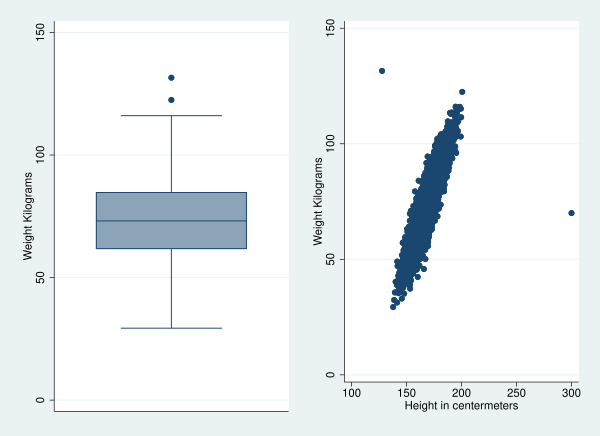

In [33]:
graph combine a b, rows(1)

Based on the above graph, we could see there is one observation with very large value of weight but small value of height. Since this observation behaves like an outlier, we would delete it.

In [34]:
list if weight_kg > 130 & height_cm < 140


       +------------------------------+
       | gender   height~m   weight~g |
       |------------------------------|
10002. | Female    127.762    131.544 |
       +------------------------------+


In [35]:
drop if weight_kg > 130 & height_cm < 140

(1 observation deleted)


After dropping the outlier, we could examine the dataset again.

In [36]:
summarize


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
   height_cm |     10,001    168.5867    9.860205   137.8284   299.9994
   weight_kg |     10,001    73.22902     14.5637   29.34798   122.4673


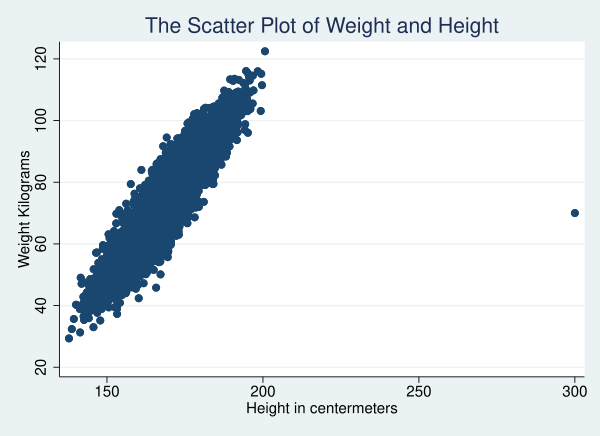

In [37]:
twoway scatter weight_kg height_cm, title("The Scatter Plot of Weight and Height")

Based on the above plot, it seems there are some outliers. 

To remove outliers, we could use `winsor` command, but we have to install it first. 
The command `winsor` deletes outliers based on the percentage you specify 
in option `p()`, and save the value into a new variable.

In [38]:
ssc install winsor

checking winsor consistency and verifying not already installed...
all files already exist and are up to date.


In [39]:
winsor height_cm, p(0.01) gen(cleaned_height_cm)

In [40]:
winsor weight_kg, p(0.01) gen(cleaned_weight_kg)

In [42]:
describe


Contains data from height_weight.dta
  obs:        10,001                          
 vars:             5                          14 Oct 2021 15:14
--------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
--------------------------------------------------------------------------------
gender          str6    %9s                   Gender information stored as text
height_cm       float   %9.0g                 Height in centermeters
weight_kg       float   %9.0g                 Weight Kilograms
cleaned_heigh~m float   %9.0g                 height_cm, Winsorized fraction .01
cleaned_weigh~g float   %9.0g                 weight_kg, Winsorized fraction .01
--------------------------------------------------------------------------------
Sorted by: 
     Note: Dataset has changed since last saved.


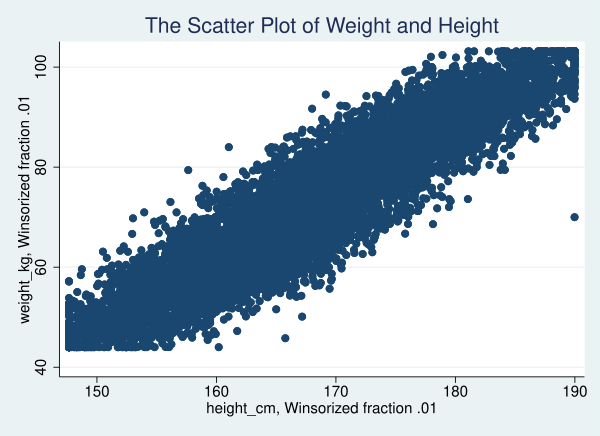

In [43]:
twoway scatter cleaned_weight_kg cleaned_height_cm, title("The Scatter Plot of Weight and Height")

##  Descriptive Statistics

After cleaning our dataset, we could like to make a table of descriptive statistics, which are used to describe the basic features of the data in a study. They provide simple summaries about the sample and the measures. Together with simple graphics analysis, they form the basis of virtually every quantitative analysis of data. A good summary of descriptive statistics should inform readers:

* sample size
* key variables that researchers and readers are about to investigate
* mean, standard deviation, distribution of variables
* highlight the trend or possible relationships among variables through correlation analysis or visualisation

With command like `describe`, `summarize` and `histogram`, we could have a good summary of descriptive statistics.

In [44]:
summarize


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
   height_cm |     10,001    168.5867    9.860205   137.8284   299.9994
   weight_kg |     10,001    73.22902     14.5637   29.34798   122.4673
cleaned_he~m |     10,001    168.5727    9.643434   147.6616    189.975
cleaned_we~g |     10,001    73.22096    14.40998   44.01492   103.1655


Since the variable `gender` is a categorical variable, which gives a collection of information that is divided into groups, such as `male` and `female` in our case. For a categorical variable, we are interested in the ratio or frequency of each group. For instance, how many people in our dataset are male? 

To answer this kind of question, we could use `tabulate` command in Stata.

In [45]:
tabulate gender


     Gender |
information |
  stored as |
       text |      Freq.     Percent        Cum.
------------+-----------------------------------
     Female |      5,000       50.00       50.00
       Male |      5,001       50.00      100.00
------------+-----------------------------------
      Total |     10,001      100.00


In our dataset, 50% of observations are male and the other half are female, which is quite balanced. This matters as sometimes we want our sample has a relative balanced ratio in terms of group category we want to investigate. 

With different categories, researchers are more interested in the key features and distribution of variables for each category. To get a statistical summary of each category, we could use `if` command.

In [46]:
summarize if gender == "Male"


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
   height_cm |      5,001    175.3518    7.482854   148.3535   299.9994
   weight_kg |      5,001    84.82959    8.974285   51.21277   122.4673
cleaned_he~m |      5,001    175.2726     7.13919   148.3535    189.975
cleaned_we~g |      5,001    84.75405     8.78589   51.21277   103.1655


In [47]:
summarize if gender == "Female"


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
      gender |          0
   height_cm |      5,000    161.8203    6.848561   137.8284   186.4095
   weight_kg |      5,000    61.62614    8.628591   29.34798    91.7348
cleaned_he~m |      5,000    161.8715    6.725271   147.6616   186.4095
cleaned_we~g |      5,000    61.68557    8.486064   44.01492    91.7348


From the above two tables, mean and standard deviations of variables for different genders varies, which is expected to be like this in this dataset but might not be the case for other datasets. If you want to have a combined table in Stata, you could use `by _____, sort: summarize ____ _____`:

In [49]:
by gender, sort: summarize cleaned_height_cm cleaned_weight_kg


--------------------------------------------------------------------------------
-> gender = Female

    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
cleaned_he~m |      5,000    161.8715    6.725271   147.6616   186.4095
cleaned_we~g |      5,000    61.68557    8.486064   44.01492    91.7348

--------------------------------------------------------------------------------
-> gender = Male

    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
cleaned_he~m |      5,001    175.2726     7.13919   148.3535    189.975
cleaned_we~g |      5,001    84.75405     8.78589   51.21277   103.1655



After calculating the main statistical features for each variable, it's better to 
organize them into a neat table, such as the following one. 

Presenting your results nicely is a vital part of your seminar paper. 

##  Data Visualisation: a picture is worth a thousand words

When we write our reports or research papers, we want our readers to understand the key features of dataset efficiently. With good graphs, one could get to grips with it. We have introduced you to plot histogram in the last lab exercise. Now, we would show you how to plot histograms over the categorical variable.

In Stata, two option command `over` and `by` are often used to plot for different categories.

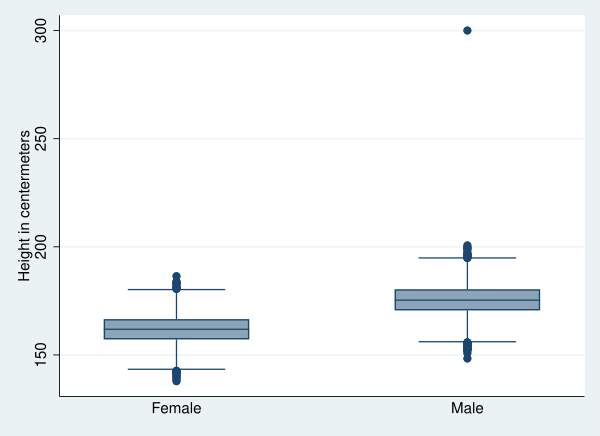

In [50]:
graph box height_cm, over(gender)

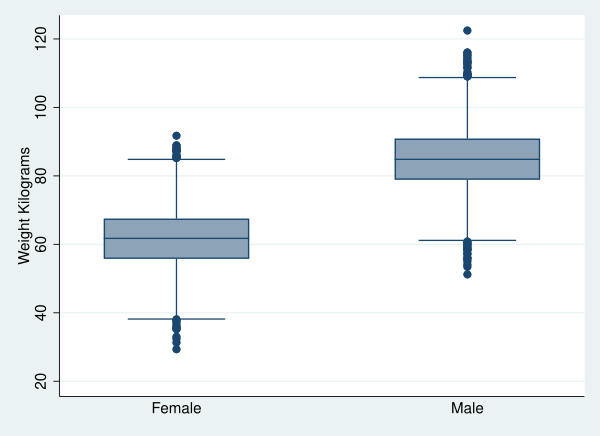

In [25]:
graph box weight_kg, over(gender)

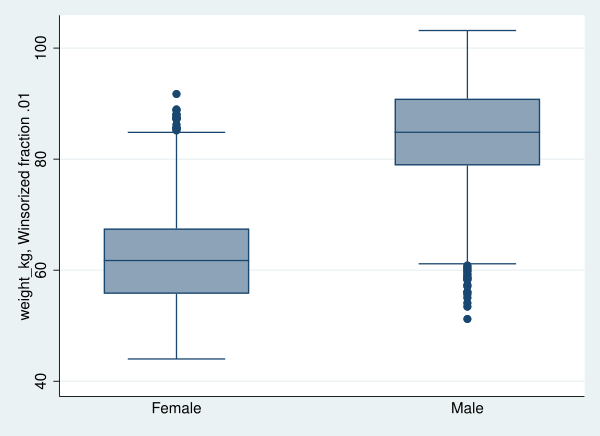

In [56]:
// box plot for cleaned weight kg
graph box cleaned_weight_kg, over(gender)

We could also plot histogram of frequency or density for each gender.

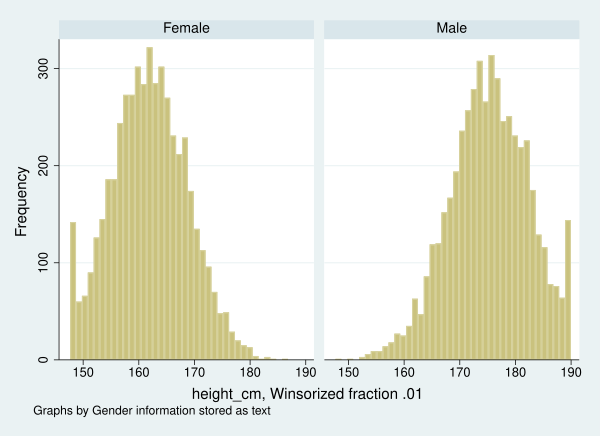

In [57]:
histogram cleaned_height_cm, frequency by(gender)

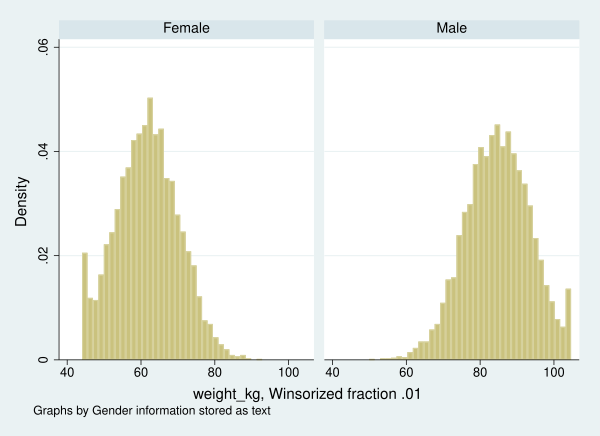

In [58]:
histogram cleaned_weight_kg, by(gender)

If you want to align your graphs vertically, you could add option `cols(1)` within `by`.

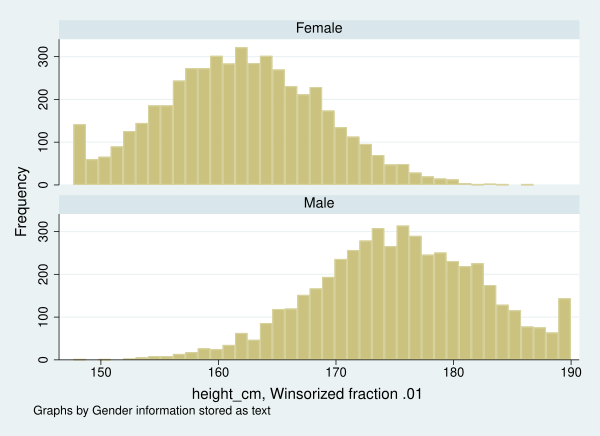

In [53]:
histogram cleaned_height_cm, frequency bin(40) by(gender, cols(1))

If you want to put two histograms into one graph, you could use `twoway` as follow with `||`, where the symbol `||` means the graph could be overlaid.

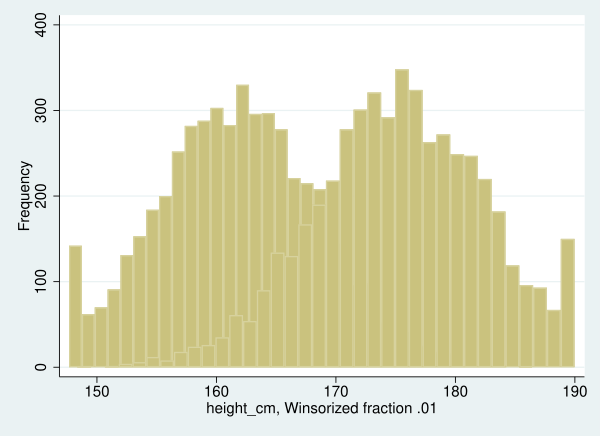

In [61]:
twoway histogram cleaned_height_cm if gender=="Female", frequency || histogram cleaned_height_cm if gender =="Male", frequency

The above graph does not look very good as two categories have the same color and it is not easy to see the difference of distribution. We could specify the different color for each gender and add the legend for it. From now on, we will not use option `frequency` as we would focus on the density plot.

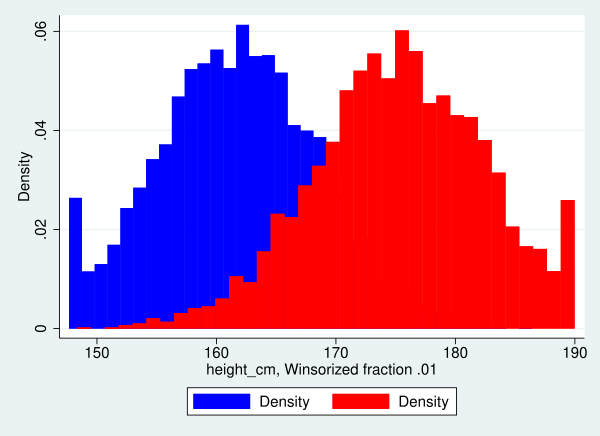

In [62]:
twoway histogram cleaned_height_cm if gender=="Female", color(blue) || histogram cleaned_height_cm if gender =="Male", color(red)

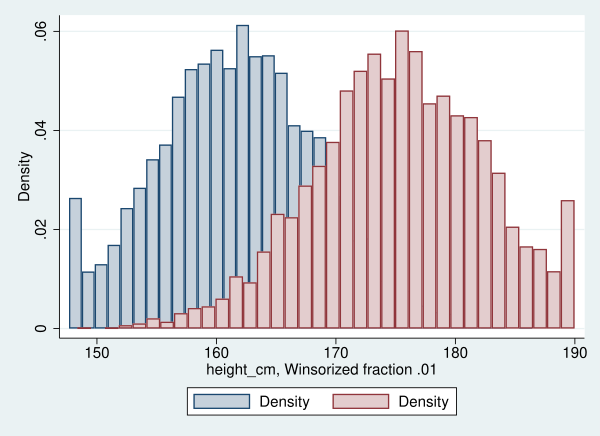

In [63]:
twoway histogram cleaned_height_cm if gender=="Female", color(navy) fcolor(navy*0.25) || histogram cleaned_height_cm if gender =="Male", color(maroon) fcolor(maroon*0.25)

## The do-file in Stata

The above code is very long and not readable. We need find a way to organize our code once you have multiple lines of code. In stata, the do-file is made for that. 

The do-file contains the Stata commands that you wish to execute. Executing a do-file is the same as executing a series of commands interactively, only you have a permanent record of your commands. This allows you to quickly reproduce work you have already done and go from there.

First, please watch this video to get yourself familiar with `do-file`:

<iframe width="618" height="315" src="https://www.youtube.com/embed/3hlTtlR-_a8" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

Once you know what the `do-file` is, then you should bear the following in your mind:

* you could comment on your code with `*`, `/*, */` or `//`
* you could use `///` to break your code when it is very long (but __be careful__, you have to select the whole code connected with `///` to execute it in the `do-file` and if you want to copy to execute it in your command window, you have to delete `///`)
* when you select the comment in the `do-file`, Stata will not execute anything as it is just comment for _human being_ to read not for _computer_ to execute.

For instance, in the `do-file`, the above code could be organized as follows. You can see that it is very convenient for us to organize our code with comment.

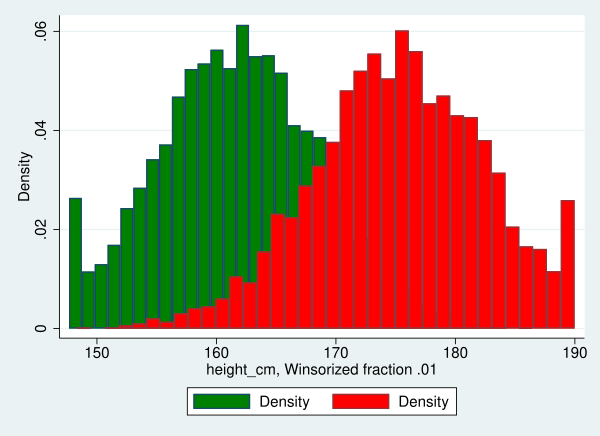

In [64]:
/*
A chunk of comment
This do-file is for IENC Lab2, which would focus on the
data analysis with normal distribution.
The following code plots the histogram over genders
opition color specifies the color of bar
opition fcolor means fill color, which it specifies
the color you want to fill

WARNING: you have to type a space before /// 
*/
twoway histogram cleaned_height_cm if gender=="Female", color(navy) /// 
fcolor(green) || histogram cleaned_height_cm if gender =="Male", color(maroon) ///
fcolor(red)

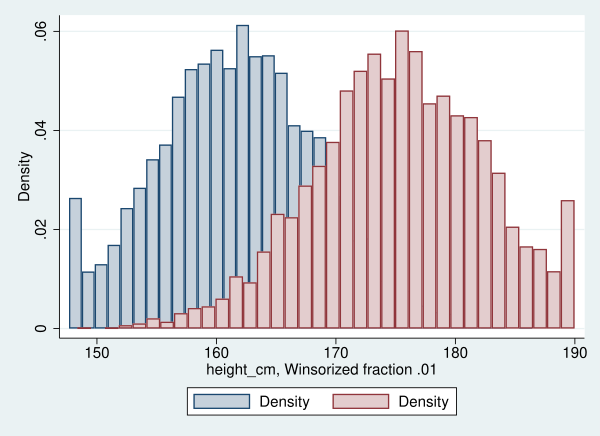

In [65]:
* DIFFERENT COMMENT STYLE
* you could also comment line by line
* the graph will look better if we could make it transparent
twoway histogram cleaned_height_cm if gender=="Female", color(navy) /// 
fcolor(navy*0.25) || histogram cleaned_height_cm if gender =="Male", /// 
color(maroon) fcolor(maroon*0.25) 
* fcolor(navy*0.25): fill color with only 0.25 densy of 
* orignal color
* you could also try fcolor(navy*0.75)
* the code now becomes more readable

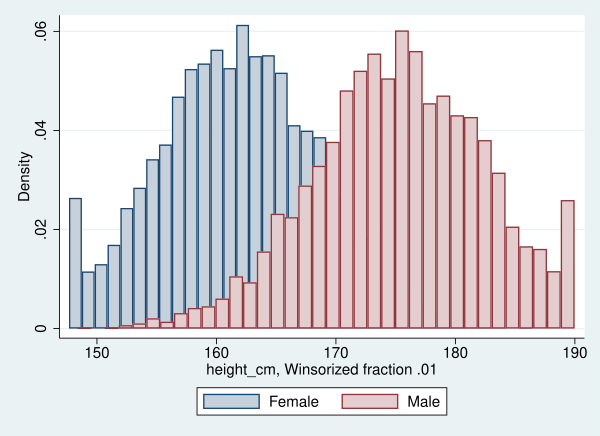

In [66]:
* you may notice that the legend is wrong
* to change it, you could use command legend(order())
twoway histogram cleaned_height_cm if gender=="Female", color(navy) /// 
fcolor(navy*0.25) || histogram cleaned_height_cm if gender =="Male", ///
color(maroon) fcolor(maroon*0.25) legend(order(1 "Female" 2 "Male"))
* order(1 "Text" 2 "Text") has to follow the order of your plot
* here, we did the height of female first and that's why it 
* is order(1 "Female" 2 "Male")
* please do not forget the quotation mark when the input is 
* "text"

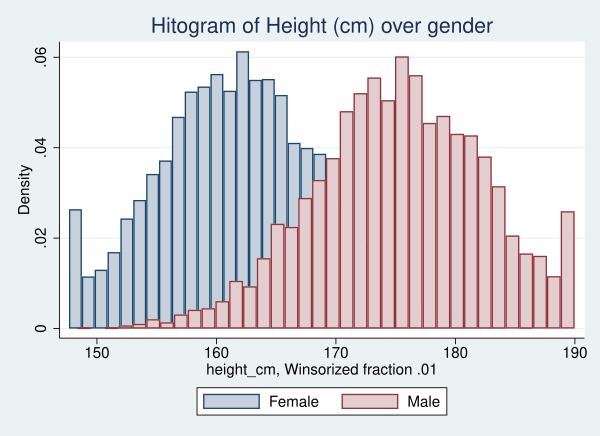

In [67]:
* add the title with title() command
twoway histogram cleaned_height_cm if gender=="Female", color(navy) /// 
fcolor(navy*0.25) || histogram cleaned_height_cm if gender =="Male", ///
color(maroon) fcolor(maroon*0.25) legend(order(1 "Female" 2 "Male")) ///
title("Hitogram of Height (cm) over gender")

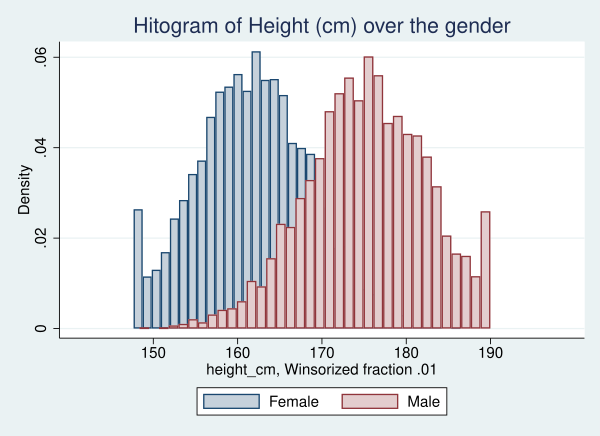

In [69]:
* if you want to adjust the range of x-axis to make the plot align in the middle
* you could use xscale(range(lowboundary highboundary))
twoway histogram cleaned_height_cm if gender=="Female", color(navy) /// 
xscale(range(140 200)) fcolor(navy*0.25) || histogram cleaned_height_cm ///
if gender =="Male", color(maroon) ///
fcolor(maroon*0.25) legend(order(1 "Female" 2 "Male")) ///
title("Hitogram of Height (cm) over the gender") 

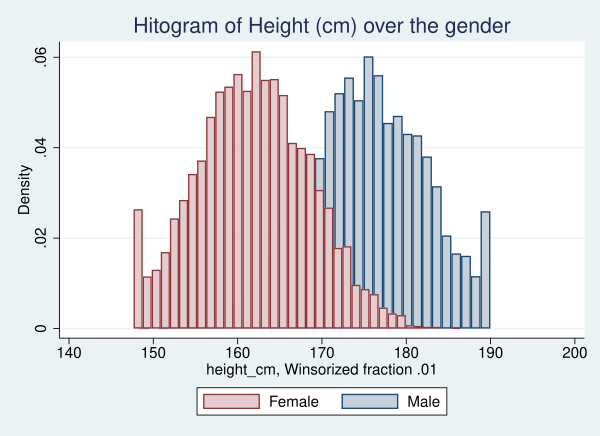

In [70]:
* now we could adjust the label of x-axis with breaks of 10 
* centimeters
* in this graph, I switched the order and make the female 
* histogram maroon and the male histogram navy blue
twoway histogram cleaned_height_cm if gender=="Male", color(navy) /// 
xscale(range(140 200)) /// 
fcolor(navy*0.25) || histogram cleaned_height_cm if gender =="Female", /// 
color(maroon) xlabel(140[10]200) ///
fcolor(maroon*0.25) legend(order(2 "Female" 1 "Male")) ///
title("Hitogram of Height (cm) over the gender") 

An even better method is to add _transparency_, which became available as of `Stata 15`. Transparency is specified as a color modifier. The option `color(maroon%30)` makes the female histogram maroon with 30 percent opacity and color(green%30) makes the male histogram navy with 30 percent opacity. The higher the opacity, the less transparent the histogram will become. So 100% opacity is the same as the original histogram.

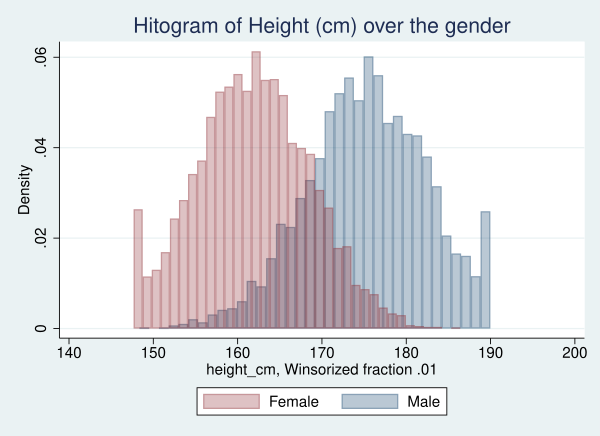

In [72]:
* The following code will only work for Stata 15
* if your stata version is below 15, you will get 
* a black histogram 
twoway histogram cleaned_height_cm if gender=="Male", color(navy%30) /// 
xscale(range(140 200)) /// 
|| histogram cleaned_height_cm if gender =="Female", color(maroon%30) ///
xlabel(140[10]200) ///
legend(order(2 "Female" 1 "Male")) ///
title("Hitogram of Height (cm) over the gender") 

Run the above code, you would have a transparent plot. Again, you __do not have to memorize these code__, you could always refer to the lab notes and tune these code to get the figures you want. However, it is still very important to understand the _grammar_ of `Stata`. So, let's review the grammar of Stata syntax again:

* Structure of syntax: `command [varlis] [if] [in], [,options]`, such as
    * `summarize if gender == "Female"`
    * `twoway histogram height_cm if gender=="Female", color(blue)`
* Be aware of the difference between `command`, numbers, and strings: when you type string, such as "Male", you need `""`, for `command` and numbers, you could just type it without `""`; to help you to notice this, we use different colors to highlight our code
* In the do-file, you could use `///` with space before and after to break your code into several parts and make it more readable.
* Use all lab files as companion to your own data analysis and focus on your research questions rather than coding, this is not a computer science course but an economic one. 
* GOOGLE is probably your best friend if this is your first time to do data analysis with a software like `Stata`.

## Normal Distribution

In probability theory, a normal (or Gaussian or Gauss or Laplace–Gauss) distribution is a type of continuous probability distribution for a real-valued random variable. The general form of its probability density function is

\begin{equation}
f_X(x, \mu, \sigma^2) = \frac{1}{\sqrt{2\pi \sigma^2}} e^{-\frac{1}{2} ( \frac{x-\mu}{\sigma})^2} = \frac{1}{\sigma \sqrt{2\pi}} e^{-\frac{1}{2} ( \frac{x-\mu}{\sigma})^2}
\end{equation}

The parameter $\mu$  is the mean or expectation of the distribution (and also its median and mode), while the parameter $\sigma$  is its standard deviation. The variance of the distribution is $\sigma^2$. A random variable with a Gaussian distribution is said to be normally distributed, and is called a normal deviate.

We will plot different normal distributions and please check the differences of graphs when we change the parameters.

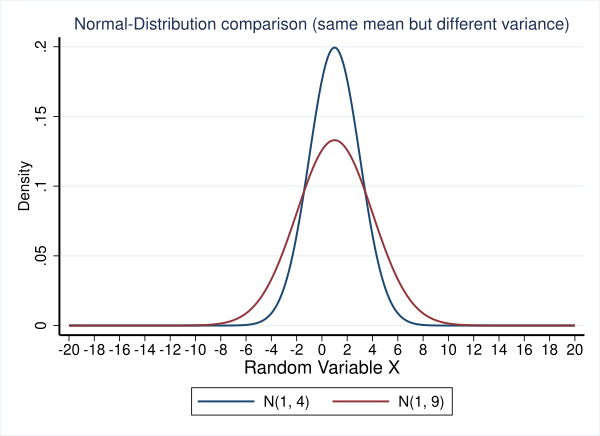

In [73]:
// drop all graphs first
graph drop _all
// lw means line width, medthick = medium thick 
graph twoway (function y=normalden(x,1,2), range(-20 20) lw(medthick)) ///
             (function y=normalden(x,1,3), range(-20 20) lw(medthick)), /// 
title("Normal-Distribution comparison (same mean but different variance)", size(medium)) /// 
xtitle("Random Variable X", size(medlarge)) ytitle("Density") ///
xlabel(-20(2)20) /// 
xscale(lw(medthick)) yscale(lw(medthick)) ///
legend(order(1 "N(1, 4)" 2 "N(1, 9)")) ///
graphregion(fcolor(white))

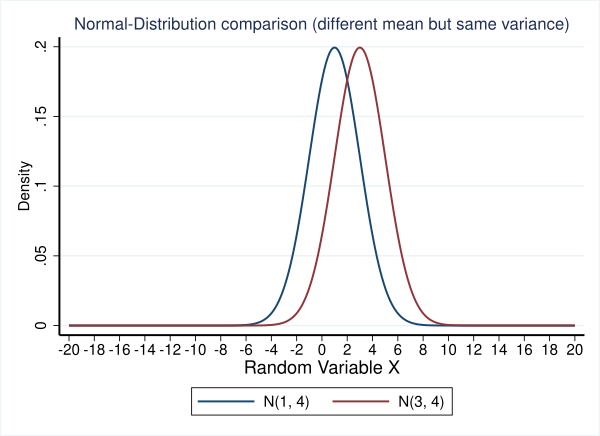

In [74]:
graph drop _all
graph twoway (function y=normalden(x,1,2), range(-20 20) lw(medthick)) ///
             (function y=normalden(x,3,2), range(-20 20) lw(medthick)), /// 
title("Normal-Distribution comparison (different mean but same variance)", size(medium)) /// 
xtitle("Random Variable X", size(medlarge)) ytitle("Density") ///
xlabel(-20(2)20) /// 
xscale(lw(medthick)) yscale(lw(medthick)) ///
legend(order(1 "N(1, 4)" 2 "N(3, 4)")) ///
graphregion(fcolor(white))

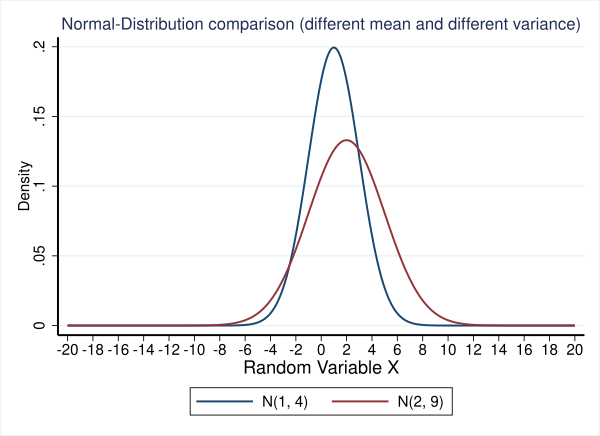

In [41]:
graph drop _all
graph twoway (function y=normalden(x,1,2), range(-20 20) lw(medthick)) ///
             (function y=normalden(x,2,3), range(-20 20) lw(medthick)), /// 
title("Normal-Distribution comparison (different mean and different variance)", size(medium)) /// 
xtitle("Random Variable X", size(medlarge)) ytitle("Density") ///
xlabel(-20(2)20) /// 
xscale(lw(medthick)) yscale(lw(medthick)) ///
legend(order(1 "N(1, 4)" 2 "N(2, 9)")) ///
graphregion(fcolor(white))

#### Beyond mean and variance

With the different graphs of normal distribution, one could easily spot that

* the mean features the center of distribution
* the variance features the deviation from the center of distribution 

In probability, we refer to mean (expected value) as the first moment and variance as the second central moment. We could introduce the third moment (skewness) and forth moment (kurtosis) to help us to identify more features of a distribution. For instance, a normal distribution is symmetrical, then its skewness is zero. When a distribution is not symmetrical, we say it is skew. The following figure gives the comparison of different distributions.

![skewness](https://upload.wikimedia.org/wikipedia/commons/thumb/c/cc/Relationship_between_mean_and_median_under_different_skewness.png/434px-Relationship_between_mean_and_median_under_different_skewness.png)

A normal distribution has the skewness of zero. To calculate the skewness of a sample, you could use `summarize` with option `[, detail]`.  

In [75]:
summarize weight_kg, detail


                      Weight Kilograms
-------------------------------------------------------------
      Percentiles      Smallest
 1%     44.01492       29.34798
 5%     50.39465       31.29048
10%      54.3223        32.3842       Obs              10,001
25%     61.60754       32.99947       Sum of Wgt.      10,001

50%     73.12118                      Mean           73.22902
                        Largest       Std. Dev.       14.5637
75%     84.89744       115.3092
90%     92.31591       115.9814       Variance       212.1012
95%     96.05725       116.0596       Skewness       .0330164
99%     103.1655       122.4673       Kurtosis       2.205382


The mean of variable `weight_kg` is $73.229$, the standard deviation is $14.564$, and its skewness is $0.033$, which is very close to zero. The kurtosis is $2.2$, less than $3$ that is the value of kurtosis for a normal distribution. We could plot the histogram and density of `weight_kg` and compare it with the normal distribution. 

(bin=40, start=29.347977, width=2.3279837)


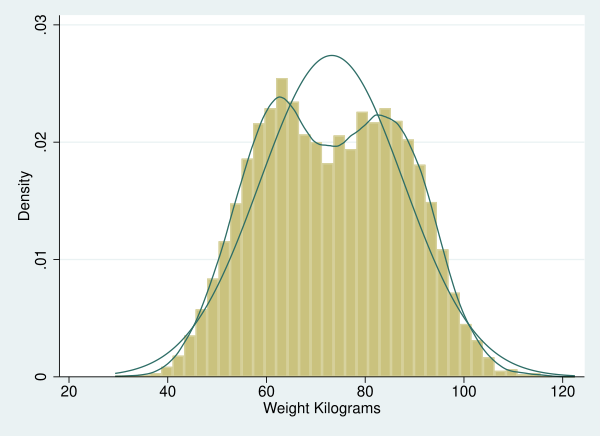

In [76]:
histogram weight_kg, normal kdensity

In [77]:
summarize weight_kg if gender == "Female", detail


                      Weight Kilograms
-------------------------------------------------------------
      Percentiles      Smallest
 1%     41.76783       29.34798
 5%     47.15325       31.29048
10%     50.39042        32.3842       Obs               5,000
25%     55.76148       32.99947       Sum of Wgt.       5,000

50%     61.74294                      Mean           61.62614
                        Largest       Std. Dev.      8.628591
75%     67.50299       88.10742
90%     72.84765       88.79912       Variance       74.45259
95%     75.65536       88.95419       Skewness      -.0132792
99%      81.3349        91.7348       Kurtosis       2.929073


The distribution of female's weight from our sample behaves almost like a normal distribution as it has skewness of almost zero (-0.01) and kurtosis of 2.93 (very close to 3). If we estimate the density for this variable again and compare it with normal distribution, they should be very close to each other, unlike the previous one.

(bin=36, start=29.347977, width=1.7329674)


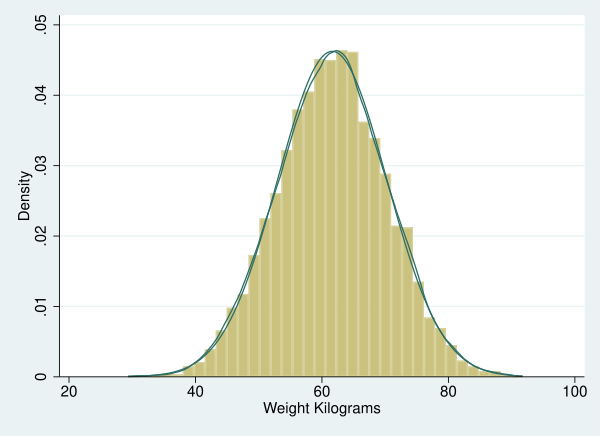

In [78]:
histogram weight_kg if gender == "Female", normal kdensity

(bin=36, start=51.212772, width=1.9792931)


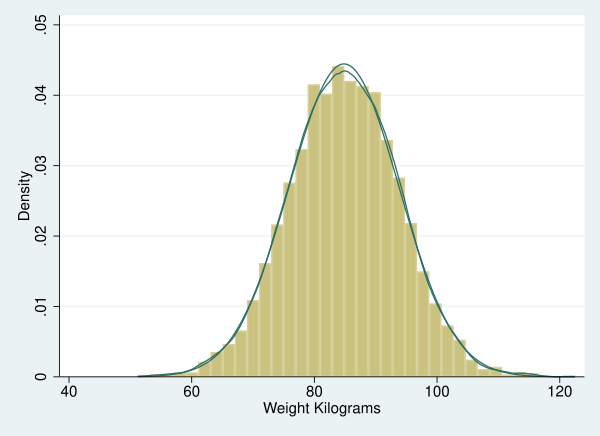

In [79]:
histogram weight_kg if gender == "Male", normal kdensity

Now, we would standardize varialbe `weight_kg` for `female` with the following formula:

$$
\text{weight-female-z} = \frac{X - \mu}{\sigma} = \frac{weight\_kg - 61.6261}{8.6286}
$$

In [80]:
// In case, you don't know where we got 61.6261 and 8.6286
summarize weight_kg if gender == "Female"


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
   weight_kg |      5,000    61.62614    8.628591   29.34798    91.7348


In [81]:
// generate a new variable with if 
// it will generate 5000 missing values as Stata will 
// generate for both genders
gen weight_female_z = (weight_kg - 61.6261)/8.6286 if gender == "Female"

(5,001 missing values generated)


In [82]:
summarize weight_female_z


    Variable |        Obs        Mean    Std. Dev.       Min        Max
-------------+---------------------------------------------------------
weight_fem~z |      5,000    4.42e-06     .999999   -3.74083   3.489408


The mean of variable `weight_female_z` is almost __zero__, which is $4.42e-6$. The standard deviation is $0.99999\approx 1$ In Stata, `e-06` stands for $10^{-6} = 0.000006$. Vice versa, `e+03` stands for $10^3$, you could play with `display` as follows.

In [50]:
display 1000000000

1.000e+09


In [51]:
display 0.000006

6.000e-06


The above process is called the standardization of a variable as it will transform the distribution of a variable into the standard normal distribution $N(0, 1)$ if it follows the normal distribution such as $weight\_female\_kg \sim N(61.6261, 8.6286^2)$.

(bin=36, start=-3.7408297, width=.20083992)


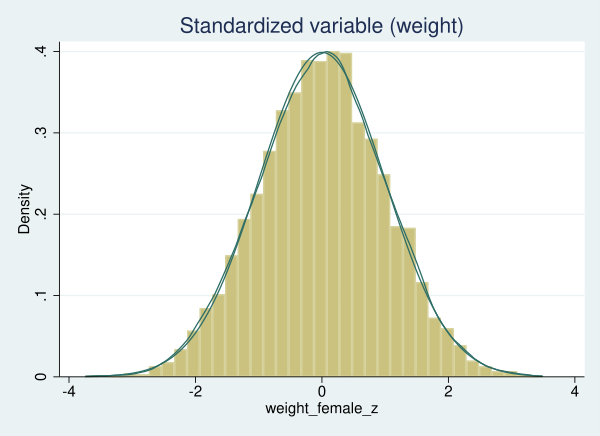

In [83]:
histogram weight_female_z, normal kdensity title("Standardized variable (weight)")

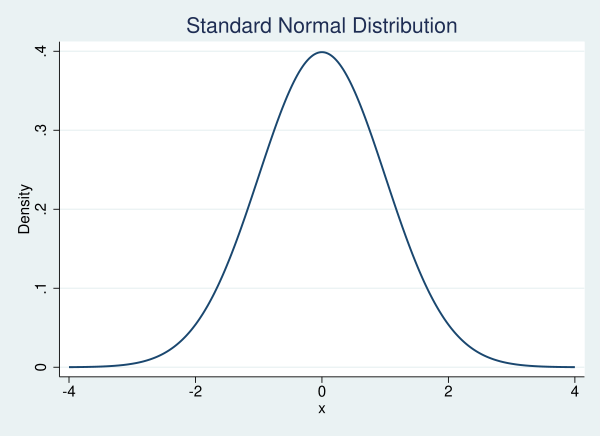

In [84]:
graph twoway function y=normalden(x,0,1), range(-4 4) lw(medthick) /// 
xtitle("x") ytitle("Density") ///
title("Standard Normal Distribution")

Since the standard normal distribution is often used in different statistical test, it is important to review concepts such as

* z-score: is a numerical measurement that describes a value's relationship to the mean of a group of values.
* p-value: is the probability of obtaining test results at least as extreme as the results actually observed, under the assumption that the null hypothesis is correct.

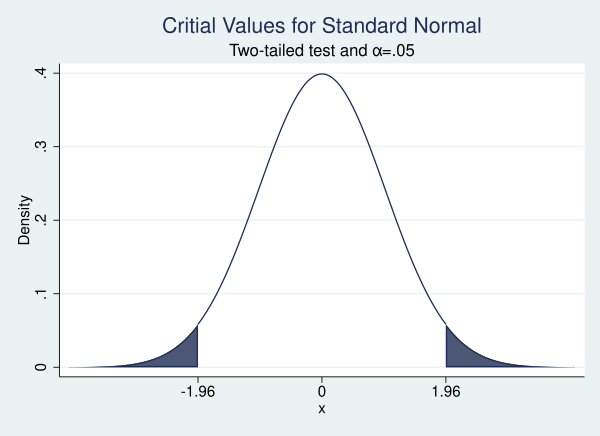

In [85]:
twoway function y=normalden(x), range(-1.96 1.96) color(dknavy) || ///
function y=normalden(x), range(-4 -1.96) recast(area) color(dknavy) || ///
function y=normalden(x), range(1.96 4) recast(area) color(dknavy) ///
xtitle("x") ///
ytitle("Density") title("Critial Values for Standard Normal") ///
subtitle("Two-tailed test and {&alpha}=.05") ///
legend(off) xlabel(-1.96 0 1.96)

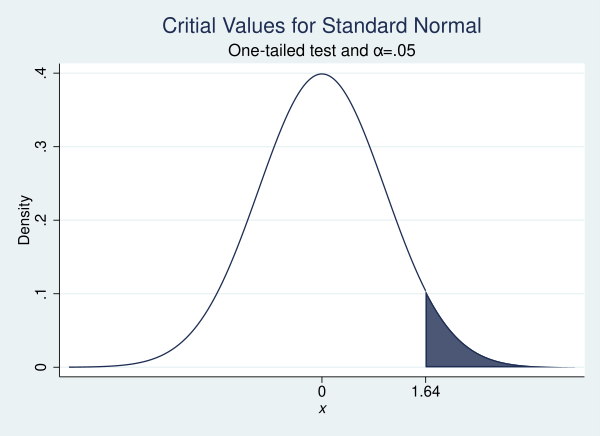

In [86]:
twoway function y=normalden(x), range(-4 1.64) color(dknavy) || ///
function y=normalden(x), range(1.64 4) recast(area) color(dknavy) ///
xtitle("{it: x}") ///
ytitle("Density") title("Critial Values for Standard Normal") ///
subtitle("One-tailed test and {&alpha}=.05") ///
legend(off) xlabel(0 1.64)

When I was in high school (like a thousand years ago), students have to know how to read the statistical tables for finding the _p-value_. The statistical table looks like the following one. You may need to refer to it too for some of your exams during your university life.

![statistictable](https://i.stack.imgur.com/FdKec.jpg)


### Test the normality of a variable

Even though the distribution of female's weight looks very like a normal distribution, we still do not know whether it fits with normal distribution or now. Therefore, we need to test the normality of this variable with the following hypothesis:

* $H_0:$ the distribution of female's weight follows the normal distribution
* $H_1:$ the distribution of female's weight does not follows the normal distribution

Stata provides several tests for us to check those hypothesis, we would introduce `Shapiro–Wilk normality test` and `skewness and kurtosis test`. 

In [87]:
// Skewness and kurtosis test 
sktest weight_kg if gender == "Female"


Skewness and kurtosis tests for normality
                                                         ----- Joint test -----
    Variable |       Obs   Pr(skewness)   Pr(kurtosis)   Adj chi2(2)  Prob>chi2
-------------+-----------------------------------------------------------------
   weight_kg |     5,000         0.7011         0.3116          1.17     0.5565


The _p-value_ is 0.5565, which is not less than 5%. Therefore, we could not reject the null hypothesis as the result is not as extreme as the null hypothesis assumed at the five percent significant level.

In [88]:
// again the p-value is very big, 0.91343
swilk weight_kg if gender == "Female"  


                   Shapiro-Wilk W test for normal data

    Variable |        Obs       W           V         z       Prob>z
-------------+------------------------------------------------------
   weight_kg |      5,000    0.99978      0.595    -1.362    0.91343

Note: The normal approximation to the sampling distribution of W'
      is valid for 4<=n<=2000.


__Congratulations! You have finished the second Lab !__

<script>
    var div_svg = document.getElementsByClassName('jp-RenderedHTML')

    for (const element of div_svg) {
        var svg_str = element.childNodes[1].srcdoc 
        element.childNodes[1].srcdoc =  svg_str.replace(/width="600px"/i, "width=100%")
    }
</script>